In [1]:
import networkx as nx
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

from scripts.utils_for_analysis import *
from scripts.plot_utils import *

# sns.set(style="darkgrid", palette="deep", font_scale=1.2)

In [2]:
def write_graph_to_csv(G, file_path):
    G = nx.Graph(G)
    G.remove_edges_from(nx.selfloop_edges(G))

    nodes = [(G.nodes[node].get('name', str(node)),) for node in G.nodes() if G.degree(node) == 0]
    edges = [(G.nodes[u].get('name', str(u)), G.nodes[v].get('name', str(v))) for u, v in G.edges()]
    df = pd.DataFrame(nodes + edges, columns=['0', '1'])
    df.to_csv(file_path, index=False, header=True, sep=' ')

# Get graph

In [ ]:
my_graph = nx.read_gml('./data/friends_network_new_updated.gml')
my_graph.remove_edges_from(nx.selfloop_edges(my_graph))

# Graph Summary

/home/sadevans/space/personal/ITMO/NetworkAnalysis/graphml_project_venv/lib/python3.8/site-packages/networkx/drawing/nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


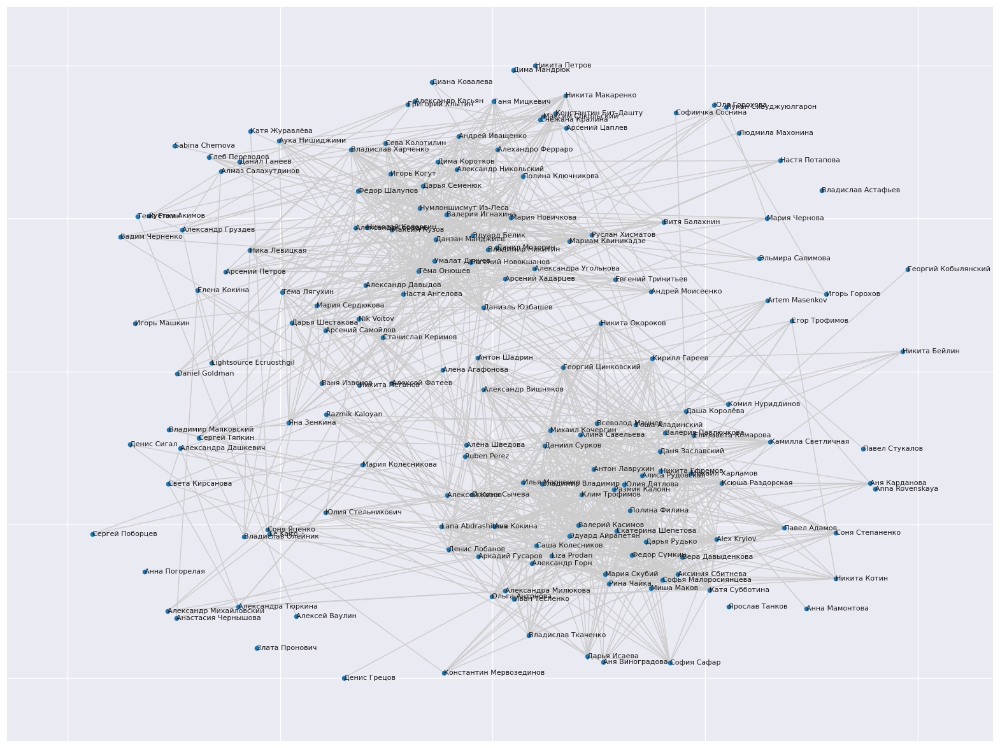

In [ ]:
pos = nx.spring_layout(my_graph, k=0.8)
plt.figure(figsize=(20, 15))

nx.draw_networkx_nodes(my_graph,
                           pos,
                           node_size=20,
                           cmap=plt.cm.coolwarm)
nx.draw_networkx_edges(my_graph,
                        pos,
                        width=1,
                        edge_color='#CCCCCC')
labels = {node: my_graph.nodes[node]['name'] for node in my_graph.nodes()}
nx.draw_networkx_labels(my_graph, pos, labels, font_size=8, horizontalalignment='left', verticalalignment='center')
plt.show()

## 1.4 - 1.8

In [77]:
local_ccs, shortest_paths, node_degree, node_seq_params = get_network_summary(my_graph)

Количество вершин: 170
Количество ребер: 1206
Диаметр: 9
Радиус: 5
Максимальная степень вершины = 42
Средняя степень вершины = 14.1882
Глобальный коэффициент кластеризации: 0.4634
Средний локальный коэффициент кластеризации: 0.4945
Средняя длина кратчайшего пути: 3.1542
Параметры распределения степеней вершин: (0.028693938867021828, -2.2250738585072014e-308, 42.00000000000001)


/home/sadevans/space/personal/ITMO/NetworkAnalysis/graphml_project_venv/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:7447: RuntimeWarning: overflow encountered in divide
  return (shape - 1) * np.sum(1 / (loc - data))  # -1/(data-loc)
/home/sadevans/space/personal/ITMO/NetworkAnalysis/graphml_project_venv/lib/python3.8/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


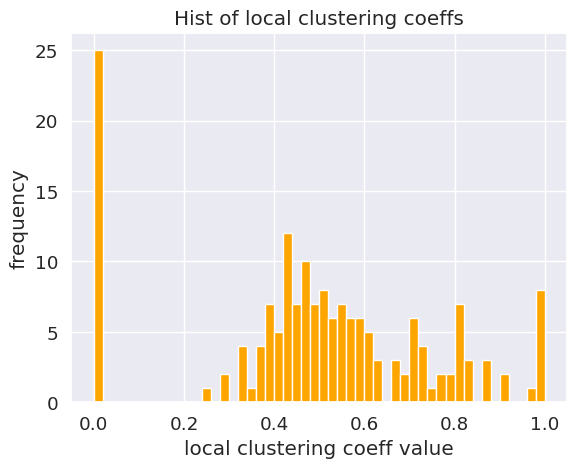

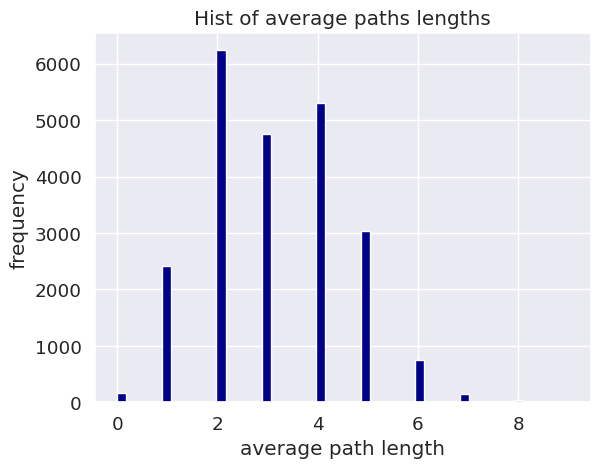

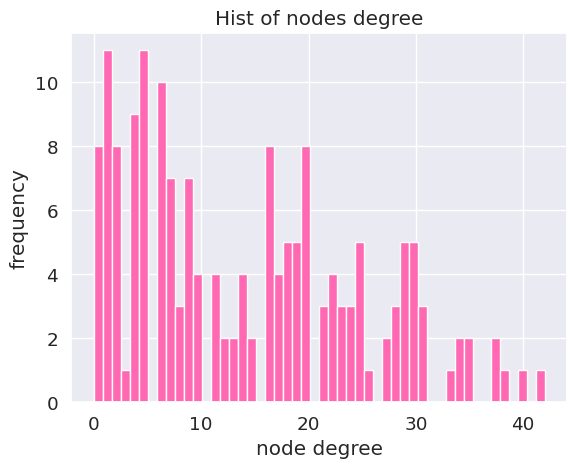

In [7]:
plot_characteristic(local_ccs, title='Hist of local clustering coeffs', xlabel='local clustering coeff value', color='orange')
plot_characteristic(shortest_paths, title='Hist of average paths lengths', xlabel='average path length', color='darkblue')
plot_characteristic(node_degree, title='Hist of nodes degree', xlabel='node degree', color='hotpink')


/tmp/ipykernel_33334/1072457015.py:8: RuntimeWarning: divide by zero encountered in power
  return -np.sum(np.log(data ** (-alpha)))
/tmp/ipykernel_33334/1072457015.py:28: RuntimeWarning: divide by zero encountered in power
  theoretical_cdf = 1 - (unique_degrees ** (-alpha_mle))


Оценка alpha: 2.000
Оценка lambda: 0.070
KS-тест: Статистика = 0.953, p-value = 0.000


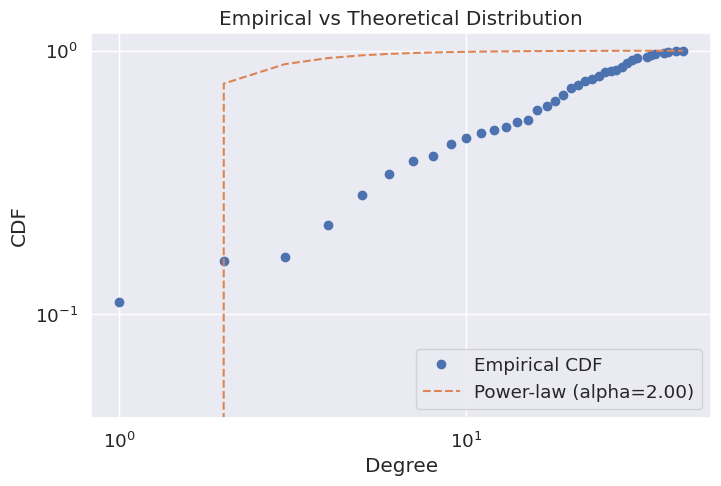

In [76]:
from scipy.optimize import minimize
from scipy.stats import ks_2samp

degrees = [d for _, d in my_graph.degree()]
unique_degrees, counts = np.unique(degrees, return_counts=True)

def power_law_mle(alpha, data):
    return -np.sum(np.log(data ** (-alpha)))

result = minimize(
    lambda alpha: power_law_mle(alpha, np.array(degrees)), 
    x0=np.array([2]),
    bounds=[(1.01, 5)]
)
alpha_mle = result.x[0]
print(f"Оценка alpha: {alpha_mle:.3f}")

lambda_mle = 1 / np.mean(degrees)
print(f"Оценка lambda: {lambda_mle:.3f}")

theoretical_power_law = np.random.power(alpha_mle, size=len(degrees))

stat, p_value = ks_2samp(degrees, theoretical_power_law)
print(f"KS-тест: Статистика = {stat:.3f}, p-value = {p_value:.3f}")

empirical_cdf = np.cumsum(counts) / sum(counts)

theoretical_cdf = 1 - (unique_degrees ** (-alpha_mle))

plt.figure(figsize=(8, 5))
plt.plot(unique_degrees, empirical_cdf, label='Empirical CDF', marker='o', linestyle='')
plt.plot(unique_degrees, theoretical_cdf, label=f'Power-law (alpha={alpha_mle:.2f})', linestyle='--')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Degree')
plt.ylabel('CDF')
plt.title('Empirical vs Theoretical Distribution')
plt.legend()
plt.show()

## 1.5 clustering coefficient

In [8]:
clustering = nx.clustering(my_graph, nodes=None, weight=None)

In [9]:
triangles = nx.triangles(my_graph)
print(triangles)

{'222147064': 136, '138663242': 0, '456264333': 15, '96071642': 2, '181356084': 124, '99975351': 0, '199576681': 5, '188558165': 212, '227836079': 28, '455068507': 16, '324010237': 130, '139917516': 0, '334497005': 113, '95183623': 13, '343146677': 7, '190437776': 79, '292061327': 86, '180153835': 66, '43922560': 11, '273004791': 49, '257134277': 8, '77680298': 8, '234042279': 139, '171313557': 12, '154905816': 13, '172388985': 16, '286941334': 92, '53039324': 0, '1637903': 10, '142344017': 21, '217272551': 64, '85957488': 154, '326799361': 186, '505876101': 11, '377995809': 1, '345693319': 103, '270533493': 29, '253955021': 0, '313670323': 0, '175797400': 109, '104793390': 97, '327204133': 11, '290533909': 11, '300755741': 213, '114150931': 15, '199471864': 27, '287149010': 52, '283667347': 80, '4166878': 8, '269954336': 21, '255566319': 8, '491137948': 157, '351371979': 201, '296823180': 27, '352997160': 24, '122468817': 97, '228735915': 32, '197081313': 309, '576080515': 3, '2409024

### transitivity

In [10]:
nx.transitivity(my_graph)

0.46336610486891383

### average clustering

In [11]:
nx.average_clustering(my_graph)

0.494546412267371

# Structural analysis

### 2.1 the most close model

In [ ]:
n = my_graph.number_of_nodes()
m = my_graph.number_of_edges()
p = (2 * m) / (n * (n - 1))
# p = 0.7
m_ba = int(round(m / n))

# n = nx.number_of_nodes(graph)
# m = nx.number_of_edges(graph)
k = np.mean([v for k, v in my_graph.degree()])

er_props, ba_props, ws_props, config_model_props = compare_network_models(my_graph, node_degree, m / float(n * (n - 1) / 2), int(k), p_ws=0.4)



my_graph_properties = get_model_properties(get_largest_component(my_graph))

print_model_properties(model_name='my graph', properties=my_graph_properties)


difference_er = calculate_difference(my_graph_properties, er_props)
difference_ba = calculate_difference(my_graph_properties, ba_props)
difference_ws = calculate_difference(my_graph_properties, ws_props)
difference_cf = calculate_difference(my_graph_properties, config_model_props)


# Print differences
print(f'Difference with ER: {difference_er}')
print(f'Difference with BA: {difference_ba}')
print(f'Difference with WS: {difference_ws}')
print(f'Difference with Configuration Model: {difference_cf}')


total_difference_er = difference_er[0] + difference_er[1] + difference_er[2]
total_difference_ba = difference_ba[0] + difference_ba[1] + difference_ba[2]
total_difference_ws = difference_ws[0] + difference_ws[1] + difference_ws[2]
total_difference_cf = difference_cf[0] + difference_cf[1] + difference_cf[2]


# Determine the best model
best_model = min([(total_difference_er, 'ER'), 
                 (total_difference_ba, 'BA'), 
                 (total_difference_ws, 'WS'),
                 (total_difference_cf, 'Configuration')], key=lambda x: x[0])

print(f'The best model is {best_model[1]} with a total difference of {best_model[0]}')


Свойства ER модели:
  Диаметр: 4
  Коэффициент кластеризации: 0.0874
  Средний кратчайший путь: 2.187

Свойства BA модели:
  Диаметр: 3
  Коэффициент кластеризации: 0.2473
  Средний кратчайший путь: 1.8782

Свойства WS модели:
  Диаметр: 4
  Коэффициент кластеризации: 0.1913
  Средний кратчайший путь: 2.2903

Свойства Configuration Model модели:
  Диаметр: 5
  Коэффициент кластеризации: 0.1641
  Средний кратчайший путь: 2.3425

Свойства my graph модели:
  Диаметр: 9
  Коэффициент кластеризации: 0.5188
  Средний кратчайший путь: 3.1542
Difference with ER: (5, 0.4314487264995186, 0.9671899369097532)
Difference with BA: (6, 0.2714923253743725, 1.2759264492661753)
Difference with WS: (5, 0.3275111927126465, 0.8638832888067252)
Difference with Configuration Model: (4, 0.3547045067391395, 0.8117137850010483)
The best model is WS with a total difference of 6.191394481519371


In [87]:

config_model = nx.Graph(nx.configuration_model(node_degree))
config_model.remove_edges_from(nx.selfloop_edges(config_model))


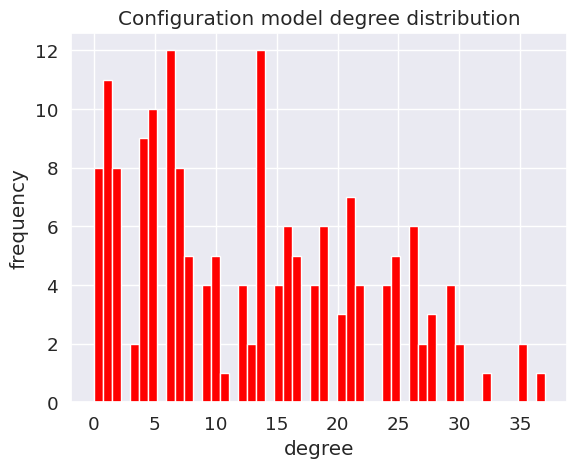

In [88]:
config_model_degree = [degree for node, degree in config_model.degree()]
plot_characteristic(
        config_model_degree,
        title='Configuration model degree distribution',
        xlabel= 'degree',
        color='red',
)




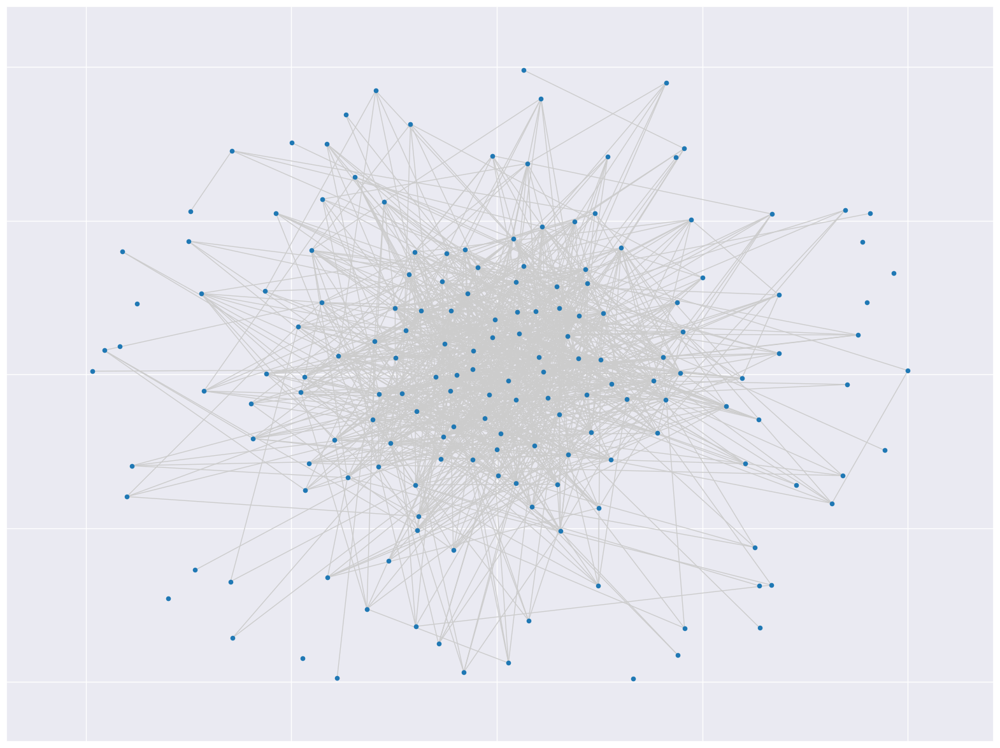

In [ ]:
pos_cf = nx.spring_layout(config_model, k=0.8)
plt.figure(figsize=(20, 15))

nx.draw_networkx_nodes(config_model,
                           pos_cf,
                           node_size=20,
                           cmap=plt.cm.coolwarm)
nx.draw_networkx_edges(config_model,
                        pos_cf,
                        width=1,
                        edge_color='#CCCCCC')
plt.show()

In [15]:
compare_graphs(my_graph)

 
Compare the number of edges
 
My network: 1206
Erdos: 1162
Barabasi: 1141
SW: 1190
 
Compare average clustering coefficients
 
My network: 0.494546412267371
Erdos: 0.08635756390354814
Barabasi: 0.16435535027897866
SW: 0.6329631642866939
 
Compare average path length
 
My network 0: 3.1541721854304634
My network 1: 1.0
My network 2: 1.1904761904761905
My network 3: 1.0
My network 4: 0
My network 5: 0
My network 6: 0
My network 7: 0
My network 8: 0
My network 9: 0
My network 10: 0
My network 11: 0
Erdos: 2.221580229725026
Barabasi: 2.19707622694048
SW: 3.2038287504350853
 
Compare graph diameter
 
My network 0: 9
My network 1: 1
My network 2: 2
My network 3: 1
My network 4: 0
My network 5: 0
My network 6: 0
My network 7: 0
My network 8: 0
My network 9: 0
My network 10: 0
My network 11: 0
Erdos: 4
Barabasi: 3
SW: 6


(<networkx.classes.graph.Graph at 0x7f9eafeee550>,
 <networkx.classes.graph.Graph at 0x7f9eb0aa0820>)

## 2.2 Centralities

In [ ]:
def friends_layout(G):
    layout = {}
    for node in G.nodes():
        attributes = G.nodes[node]
        x = attributes['friends_count'] / max([G.nodes[n]['friends_count'] for n in G.nodes()])
        layout[node] = [x, attributes['vk_id']]
    return layout

In [ ]:
pos = friends_layout(my_graph)

In [ ]:
def centralities(G):
    return {
        'degree': np.array([dc for dc in nx.degree_centrality(G).values()]),
        'closeness': np.array([dc for dc in nx.closeness_centrality(G).values()]),
        'betweenness': np.array([dc for dc in nx.betweenness_centrality(G).values()])
    }


def top10_centralities(G):
    centr_dict = centralities(G)
    res = {}
    for key in ['degree', 'closeness', 'betweenness']:
      top_k_els = np.sort(centr_dict[key])[::-1][:10]
      indices = np.argpartition(centr_dict[key], -10)[-10:][::-1]
      names = np.array(list(nx.get_node_attributes(G, 'name').values()))[indices].tolist()
      sex = np.array(list(nx.get_node_attributes(G, 'sex').values()))[indices].tolist()
      vk_id = np.array(list(nx.get_node_attributes(G, 'vk_id').values()))[indices].tolist()
      first_name = np.array(list(nx.get_node_attributes(G, 'first_name').values()))[indices].tolist()


      df = pd.DataFrame(data={'vk_id':vk_id, 'name': names, 'first_name':first_name,'sex': sex, 'centrality': top_k_els})
      res[key] = df

    return res


In [19]:
my_graph_centr = centralities(my_graph)
top_dfs = top10_centralities(my_graph)


Degree centrality


,vk_id,name,first_name,sex,centrality
0,165439470,Размик Калоян,Размик,male,0.248521
1,389009557,Тёма Онюшев,Тёма,male,0.236686
2,164631393,Михаил Харламов,Михаил,male,0.224852
3,300755741,Аня Кокина,Аня,female,0.218935
4,505077996,Дарья Рудько,Дарья,female,0.218935
5,160234864,Мария Новичкова,Мария,female,0.207101
6,197081313,Владимир Владимир,Владимир,male,0.207101
7,313086600,Эдуард Айрапетян,Эдуард,male,0.201183
8,167640397,Евгений Новокшанов,Евгений,male,0.201183
9,556708847,Умалат Дукуев,Умалат,male,0.195266


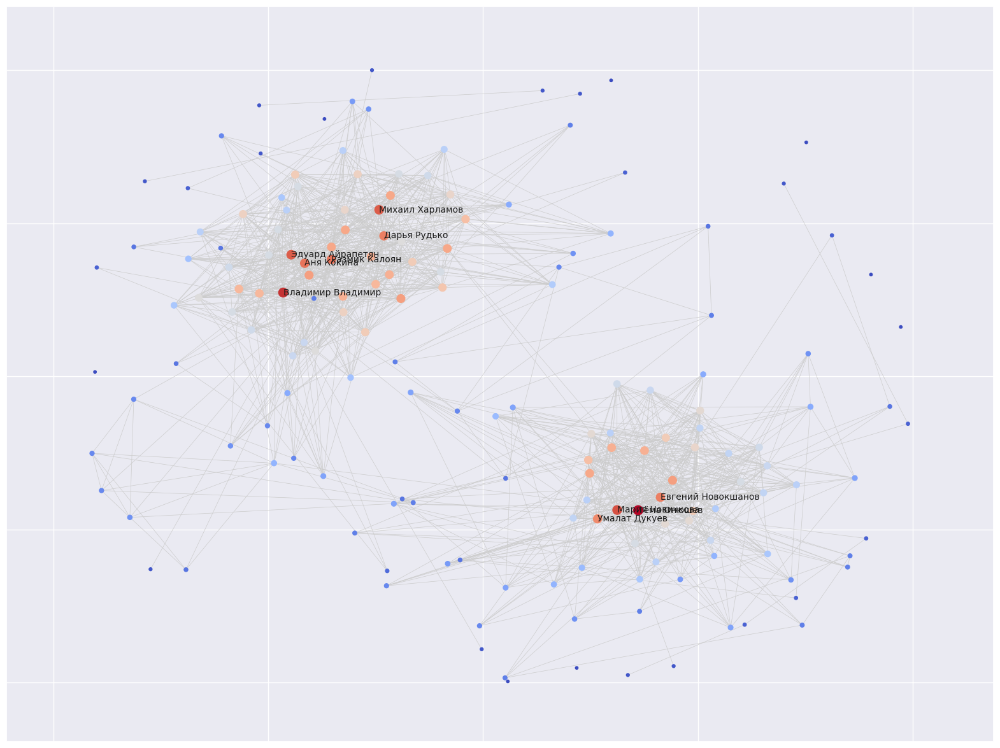

Closeness centrality


,vk_id,name,first_name,sex,centrality
0,165439470,Размик Калоян,Размик,male,0.428090
1,300755741,Аня Кокина,Аня,female,0.391577
2,226470141,Никита Ефремов,Никита,male,0.379305
3,167640397,Евгений Новокшанов,Евгений,male,0.370853
4,286941334,Александра Угольнова,Александра,female,0.364756
5,164631393,Михаил Харламов,Михаил,male,0.363760
6,313086600,Эдуард Айрапетян,Эдуард,male,0.362769
7,505077996,Дарья Рудько,Дарья,female,0.358857
8,179996506,Софья Малоросиянцева,Софья,female,0.356933
9,220038542,Михаил Кочергин,Михаил,male,0.355979


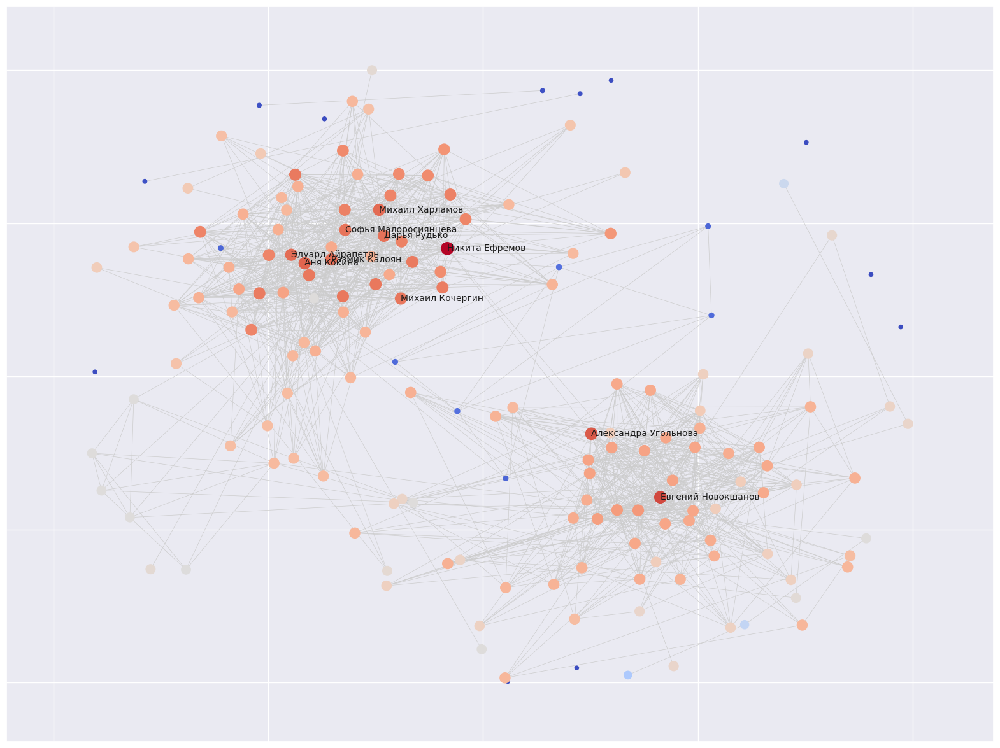

Betweenness centrality


,vk_id,name,first_name,sex,centrality
0,260431459,Мария Колесникова,Мария,female,0.394097
1,226470141,Никита Ефремов,Никита,male,0.247135
2,300755741,Аня Кокина,Аня,female,0.152461
3,167640397,Евгений Новокшанов,Евгений,male,0.107979
4,286941334,Александра Угольнова,Александра,female,0.100196
5,160234864,Мария Новичкова,Мария,female,0.057062
6,164631393,Михаил Харламов,Михаил,male,0.033191
7,505077996,Дарья Рудько,Дарья,female,0.028563
8,389009557,Тёма Онюшев,Тёма,male,0.028382
9,145199583,Екатерина Шепетова,Екатерина,female,0.024253


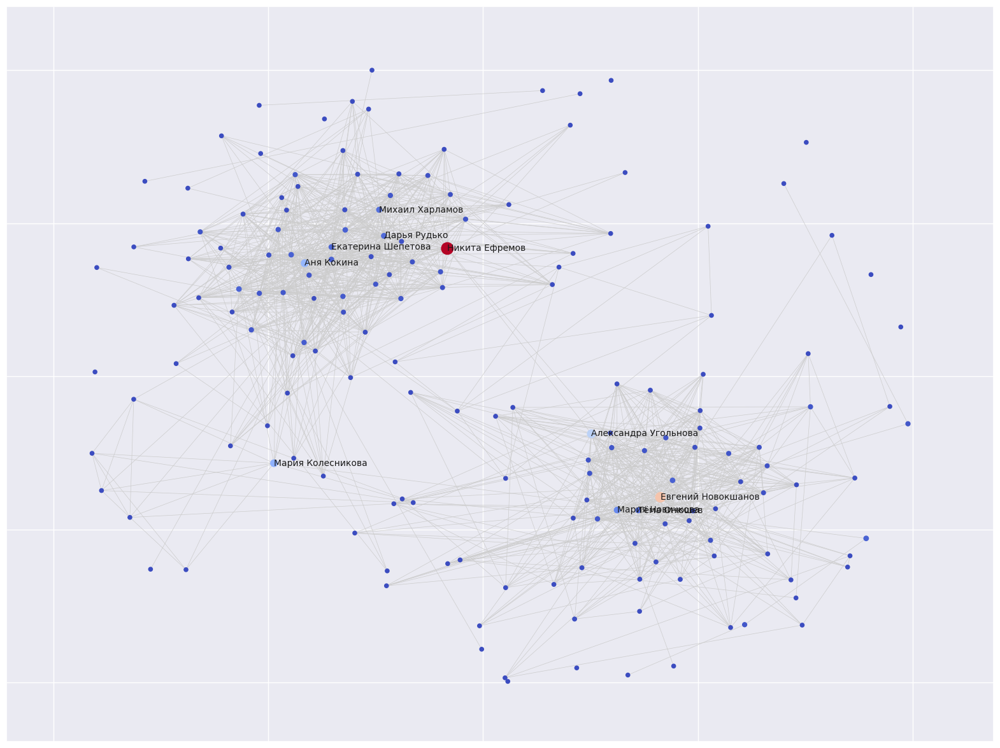

In [ ]:
pos = nx.spring_layout(my_graph, k=0.7) 

cases = [['degree', 400, 10, 'Degree centrality'],
         ['closeness', 400, 20, 'Closeness centrality'],
         ['betweenness', 400, 20, 'Betweenness centrality']]
for c_key, scale, bias, title in cases:
    print(title)
    display(top_dfs[c_key])
    plt.figure(figsize=(20, 15))
    nx.draw_networkx_nodes(my_graph,
                           pos,
                           node_size=my_graph_centr[c_key]*scale + bias,
                           node_color=my_graph_centr[c_key],
                           cmap=plt.cm.coolwarm)
    nx.draw_networkx_edges(my_graph,
                           pos,
                           width=0.5,
                           edge_color='#CCCCCC') 
    top_nodes = top_dfs[c_key]['vk_id'].head(10).tolist()
    labels = {node: my_graph.nodes[node]['name'] for node in top_nodes}
    nx.draw_networkx_labels(my_graph, pos, labels, font_size=10, horizontalalignment='left', verticalalignment='center')
    # plt.title(title)
    plt.savefig(f'./figs/{c_key}.png', dpi=700)

    plt.show()

In [ ]:
def friends_graph_center(G):
    central_nodes = []
    closeness = nx.closeness_centrality(G)
    central_nodes = set([node for node, value in closeness.items() if value > 0.11])
    subG = G.subgraph(central_nodes).copy()
    extra_nodes = [n for n, d in subG.degree if d == 1]
    extra_nodes.extend([31, 124, 169, 135, 168])
    central_nodes = central_nodes.difference(extra_nodes)
    return G.subgraph(central_nodes).copy()

In [21]:
sub_my_graph = friends_graph_center(my_graph)

## 2.3 Page-Rank. HITS (в случае ориентированной сети). Correlation comparison of centralities and prestige. Сравнение топ-вершин.

In [ ]:
def transition_matrix(A):
    sumA = A.sum(axis=1)
    sumA[sumA == 0] = 1
    return A / sumA[:, None]


def teleportation_vector(A):
    return np.ones(A.shape[0]) / A.shape[0]


def update_rank(rank, P, v, alpha):
    return alpha * P.T @ rank + (1 - alpha) * v


def page_rank(G, alpha, k):
    A = nx.to_numpy_array(G)
    P = transition_matrix(A)
    v = teleportation_vector(A)
    rank = np.ones(A.shape[0]) / A.shape[0]
    for _ in range(k):
        rank = update_rank(rank, P, v, alpha)
    return {'page rank' : rank / rank.sum()}


def rank_matrix_by_alpha(G, alphas, k):
    rank_matrix = np.zeros((len(alphas), G.number_of_nodes()))
    
    for i, alpha in enumerate(alphas):
        rank_matrix[i] = page_rank(G, alpha, k)

    return rank_matrix


def top10_pagerank(G):
    pagerank = nx.pagerank(G)
    top_k_els = np.sort(list(pagerank.values()))[::-1][:10]
    indices = np.argpartition(list(pagerank.values()), -10)[-10:][::-1]
    names = np.array(list(nx.get_node_attributes(G, 'name').values()))[indices].tolist()
    sex = np.array(list(nx.get_node_attributes(G, 'sex').values()))[indices].tolist()
    vk_id = np.array(list(nx.get_node_attributes(G, 'vk_id').values()))[indices].tolist()
    first_name = np.array(list(nx.get_node_attributes(G, 'first_name').values()))[indices].tolist()

    df = pd.DataFrame(data={'vk_id': vk_id, 'name': names, 'first_name': first_name, 'sex': sex, 'pagerank': top_k_els})
    return {'page rank': df}


In [23]:
page_rank_val = page_rank(my_graph, 0.9, 100)
top_pagerank = top10_pagerank(my_graph)

Page Rank


,vk_id,name,first_name,sex,pagerank
0,197081313,Владимир Владимир,Владимир,male,0.016616
1,167640397,Евгений Новокшанов,Евгений,male,0.015803
2,164631393,Михаил Харламов,Михаил,male,0.013070
3,160234864,Мария Новичкова,Мария,female,0.012680
4,389009557,Тёма Онюшев,Тёма,male,0.012458
5,556708847,Умалат Дукуев,Умалат,male,0.012361
6,300755741,Аня Кокина,Аня,female,0.012203
7,351371979,Валерия Игнахина,Валерия,female,0.011950
8,313086600,Эдуард Айрапетян,Эдуард,male,0.011497
9,505077996,Дарья Рудько,Дарья,female,0.011303


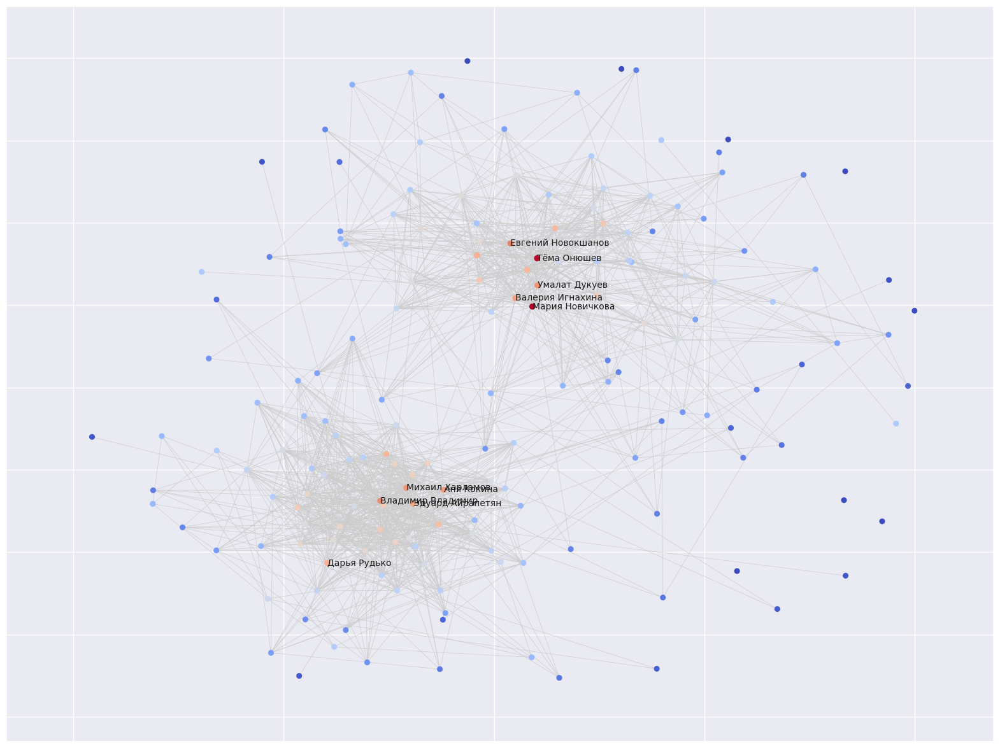

In [ ]:
pos = nx.spring_layout(my_graph, k=0.7)

cases = [['page rank', 300, 30, 'Page Rank'],]
for c_key, scale, bias, title in cases:
    print(title)
    display(top_pagerank[c_key])
    plt.figure(figsize=(20, 15))
    nx.draw_networkx_nodes(my_graph,
                           pos,
                           node_size=page_rank_val[c_key]*scale + bias,
                           node_color=page_rank_val[c_key],
                           cmap=plt.cm.coolwarm)
    nx.draw_networkx_edges(my_graph,
                           pos,
                           width=0.5,
                           edge_color='#CCCCCC')
    top_nodes = top_pagerank[c_key]['vk_id'].head(10).tolist()
    labels = {node: my_graph.nodes[node]['name'] for node in top_nodes}
    nx.draw_networkx_labels(my_graph, pos, labels, font_size=10, horizontalalignment='left', verticalalignment='center')
    # plt.title(title)
    plt.show()

## 2.4 Сorrelation

In [ ]:
def pearson_correlation(i_vals: np.array, j_vals: np.array) -> float:

    return np.corrcoef(i_vals, j_vals)[0][1]


def eigenvector_centrality(A: np.array) -> np.array:

    eigen_vals, eigen_vect = np.linalg.eig(A)
    max_eigenval_ind = eigen_vals.argmax()
    lambda_ = eigen_vals.max()
    centrality = eigen_vect[:, max_eigenval_ind]

    centrality = np.abs(centrality)

    return centrality


def katz_centrality(G: nx.Graph, n: int, beta: float) -> np.array:

    A = nx.to_numpy_array(G)
    eigenvalues = np.linalg.eigvals(A)
    lambda_max = max(eigenvalues)
    if beta >= 1 / lambda_max:
        raise ValueError("β must be less than 1 / λ, where λ is the largest eigenvalue.")
    k = 0
    A_power = np.copy(A)
    for i in range(1, n + 1):
        k += beta**i * np.sum(A_power, axis=1)
        A_power = np.dot(A_power, A)
    return k

In [28]:
centvals = [
    ('Degree', list(nx.degree_centrality(my_graph).values())),
    ('Closeness', list(nx.closeness_centrality(my_graph).values())),
    ('Betweenness', list(nx.betweenness_centrality(my_graph).values())),
    ('Page Rank', list(page_rank_val['page rank'])),
]

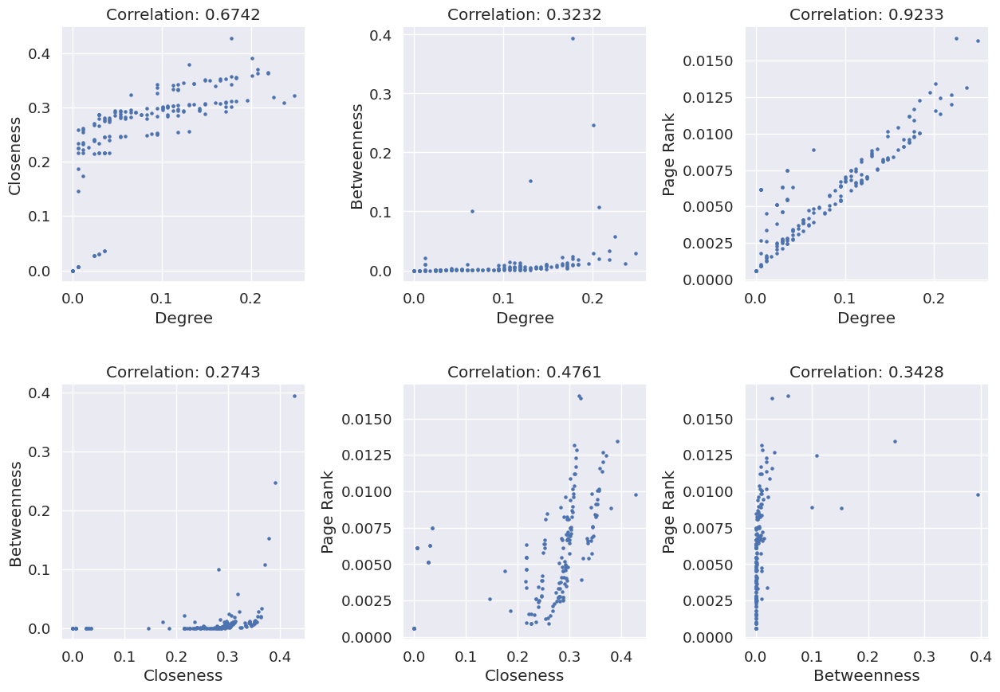

In [29]:
plt.figure(figsize=(3*5, 2*5))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
k = 1
for i in range(len(centvals)):
    for j in range(i + 1, len(centvals)):
        i_label, i_vals = centvals[i]
        j_label, j_vals = centvals[j]
        correlation = pearson_correlation(i_vals, j_vals)
        plt.subplot(2, 3, k)
        plt.scatter(i_vals, j_vals, s=5)
        plt.title('Correlation: {:.4f}'.format(correlation))
        plt.xlabel(i_label)
        plt.ylabel(j_label)
        k += 1

## 2.5 Assortative mixing

In [ ]:
def mixing_matrix(G, mapping, attribute_name):
    num_attrs = len(mapping)

    mixing_matrix = np.zeros((num_attrs, num_attrs))
    edge_count = 0
    for u, v in G.edges():
        try:
            if attribute_name == 'city':
                conf_u = mapping.get(G.nodes[u].get(attribute_name, {}).get('title'), -1)
                conf_v = mapping.get(G.nodes[v].get(attribute_name, {}).get('title'), -1)
            elif attribute_name == 'universities':
                conf_u = mapping.get(G.nodes[u].get(attribute_name, [])[0].get('name'), -1)
                conf_v = mapping.get(G.nodes[v].get(attribute_name, [])[0].get('name'), -1)
            else:
                conf_u = mapping.get(G.nodes[u].get(attribute_name, -1), -1)
                conf_v = mapping.get(G.nodes[v].get(attribute_name, -1), -1)
            if conf_u != -1 and conf_v != -1 and conf_u != conf_v:
                mixing_matrix[conf_u, conf_v] += 1
                mixing_matrix[conf_v, conf_u] += 1
        except:
            # print(f"Error processing edge ({u}, {v}): {e}")
            continue


    mixing_matrix /= 2 * G.number_of_edges()

    return mixing_matrix



def truncate_text(text, max_length=30):
    if len(text) > max_length:
        return text[:max_length-3] + "..."
    else:
        return text


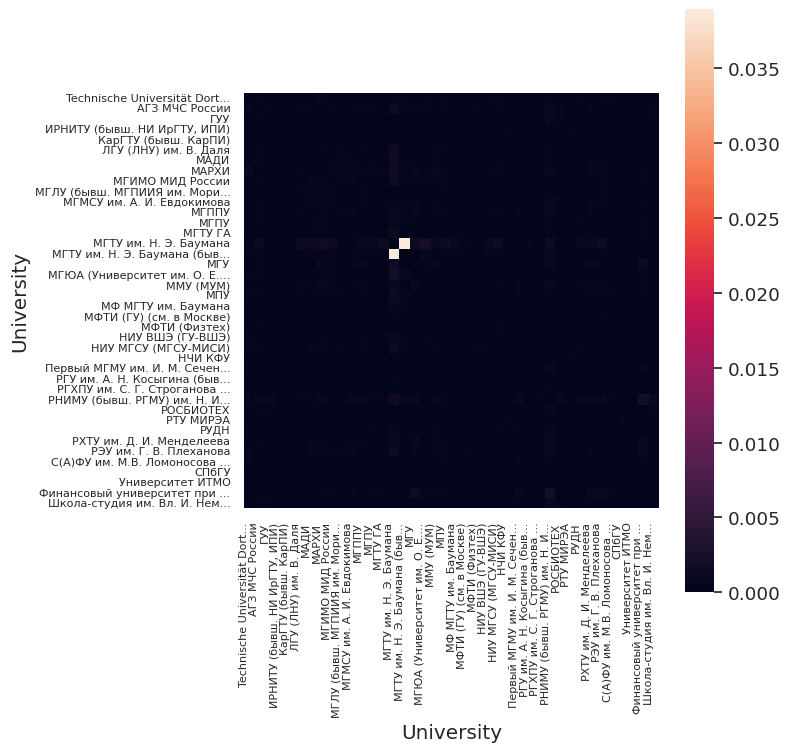

In [224]:
unis = []
for n in my_graph.nodes:
    uni = my_graph.nodes[n].get('universities')
    
    if uni:
        # print(uni)
        unis.append(uni[0].get('name'))

unis_values = np.unique([uni for uni in unis if uni])
cropped_unis_values = [truncate_text(uni) for uni in unis_values]
mapping_unis = {val: i for i, val in enumerate(unis_values)}
mixing_unis = mixing_matrix(my_graph, mapping_unis, 'universities')
# mixing_unis
fig = plt.figure(figsize=(8, 8))
hmap = sns.heatmap(
    mixing_unis,
    cbar=True,
    square=True,
    xticklabels=True,
    yticklabels=True,
    annot=False,
    # fmt='d',
    )

num_ticks = min(mixing_unis.shape[0], len(unis_values))

hmap.set_xticklabels(cropped_unis_values, rotation=90, ha='right', fontsize=8)
hmap.set_yticklabels(cropped_unis_values, rotation=0, fontsize=8)
plt.xlabel('University')
plt.ylabel('University')
plt.tight_layout()
plt.show()

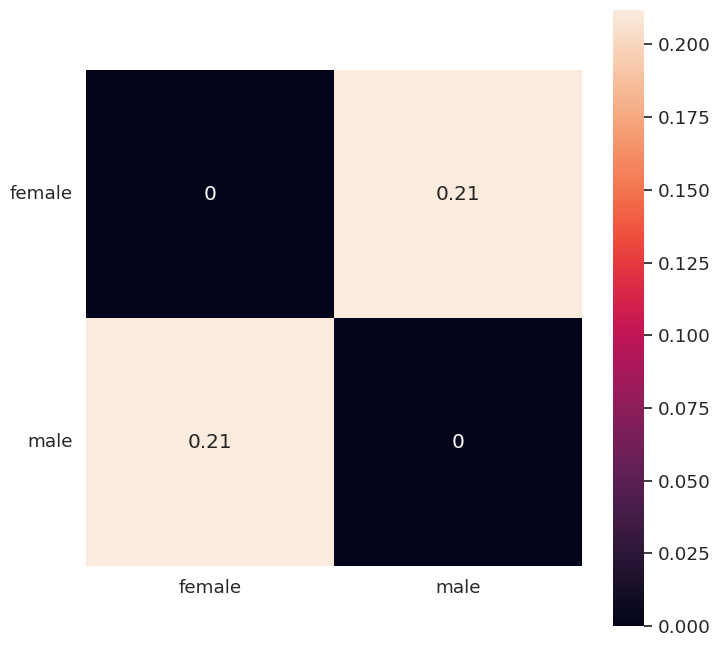

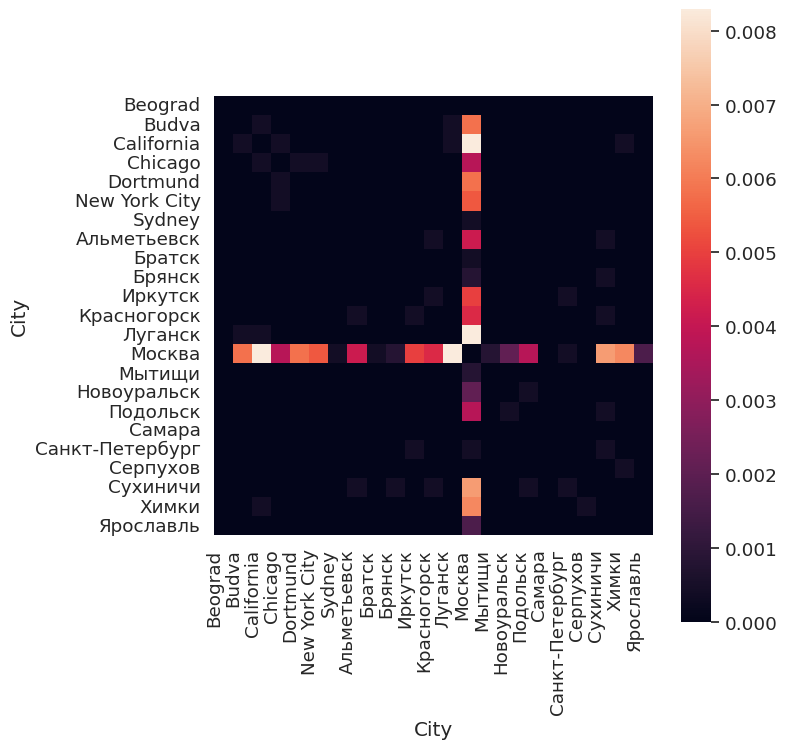

In [220]:
sex_values = np.random.permutation(
    np.unique([my_graph.nodes[n]['sex'] for n in my_graph.nodes])
)
mapping_sex = {val: i for i, val in enumerate(sex_values)}
mixing_sex = mixing_matrix(my_graph, mapping_sex, 'sex')
fig = plt.figure(figsize=(8, 8))
hmap = sns.heatmap(
    mixing_sex,
    cbar=True,
    annot=True,
    xticklabels=True,
    yticklabels=True,
    square=True)
hmap.set_xticklabels([m for m in mapping_sex])
hmap.set_yticklabels([m for m in mapping_sex], rotation=0)
plt.show()

cities = []
for n in my_graph.nodes:
    city = my_graph.nodes[n].get('city')
    if city:
        cities.append(city.get('title'))

cities_values = np.unique([city for city in cities if city])
mapping_cities = {val: i for i, val in enumerate(cities_values)}
mixing_cities = mixing_matrix(my_graph, mapping_cities, 'city')
fig = plt.figure(figsize=(8, 8))
hmap = sns.heatmap(
    mixing_cities,
    cbar=True,
    square=True,
    xticklabels=True,
    yticklabels=True,
    annot=False,
    # fmt='d',
    )
hmap.set_xticklabels(cities_values, rotation=90, ha='right')
hmap.set_yticklabels(cities_values, rotation=0)
plt.xlabel('City')
plt.ylabel('City')
# plt.title('Mixing Matrix by City')
plt.tight_layout()
plt.show()

In [ ]:
def assortativity_coef(mixing):
    sum_E2 = np.sum(mixing @ mixing)
    r = (np.trace(mixing) - sum_E2) / (1 - sum_E2)
    return r

In [37]:
print(f'Assortativity coefficient for sex: {assortativity_coef(mixing_sex):.4f}')
print(f'Assortativity coefficient for cities: {assortativity_coef(mixing_cities):.4f}')



Assortativity coefficient for sex: -0.0986
Assortativity coefficient for cities: -0.0061


## 2.6 Similarity of nodes

In [247]:
def sim_values(A, i, j):
    x = A[i] - np.mean(A[i])
    y = A[j] - np.mean(A[j])
    cov_ij = np.sum(x * y)
    std_i = np.sqrt(np.sum(x * x))
    std_j = np.sqrt(np.sum(y * y))
    
    if std_i == 0 or std_j == 0:
        pearson_corr = 0
    else:
        pearson_corr = cov_ij / (std_i * std_j)

    neighbors_i = set(np.where(A[i] > 0)[0])
    neighbors_j = set(np.where(A[j] > 0)[0])
    
    intersection = len(neighbors_i.intersection(neighbors_j))
    union = len(neighbors_i.union(neighbors_j))

    if union == 0:
        jaccard = 0
    else:
        jaccard = intersection / union

    dot_product = np.dot(A[i], A[j])
    norm_i = np.linalg.norm(A[i])
    norm_j = np.linalg.norm(A[j])

    if norm_i == 0 or norm_j == 0:
        cosine = 0
    else:
        cosine = dot_product / (norm_i * norm_j)

    return pearson_corr, jaccard, cosine

In [ ]:
A = nx.to_numpy_array(my_graph)
cos_sim = np.zeros(A.shape)
pearson_sim = np.zeros(A.shape)
jaccard_sim = np.zeros(A.shape)
for i in range(len(my_graph)):
    for j in range(i, (len(my_graph))):
        pval, jval, cval = sim_values(A, i, j)
        pearson_sim[i, j] = pval
        pearson_sim[j, i] = pval
        jaccard_sim[i, j] = jval
        jaccard_sim[j, i] = jval
        cos_sim[i, j] = cval
        cos_sim[j, i] = cval

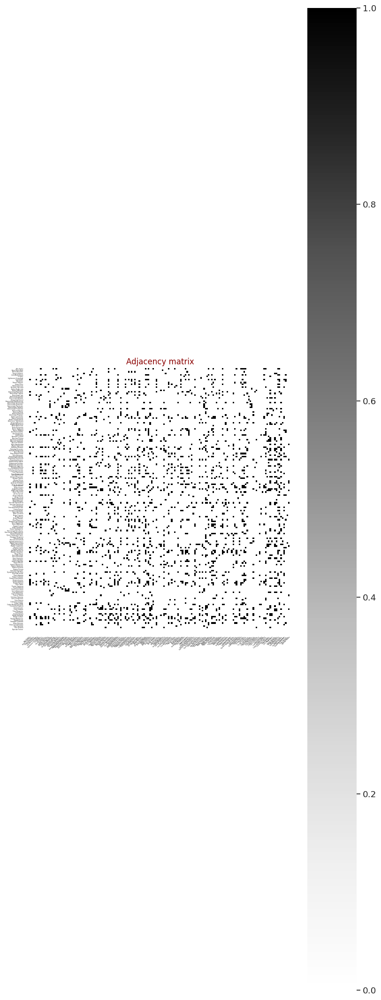

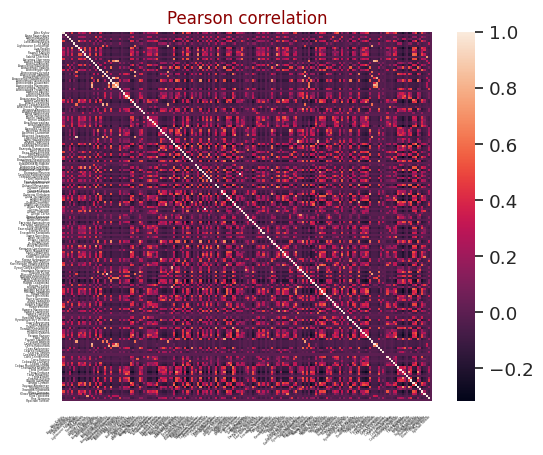

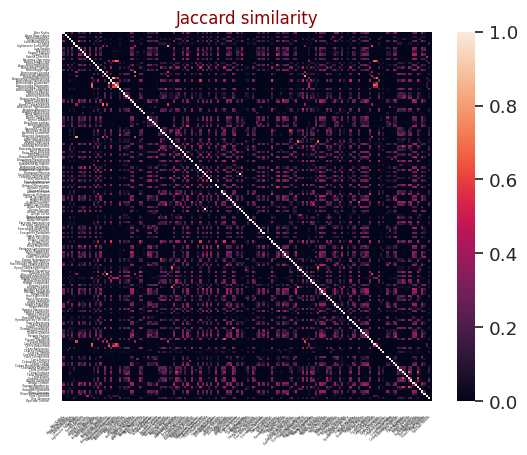

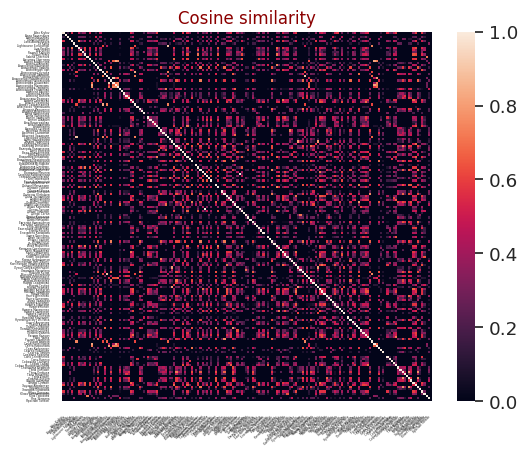

In [ ]:
labs = nx.get_node_attributes(my_graph, "name")
labs = {i:labs[i] for i in labs}


fig = plt.figure(figsize=(9, 9*4))
cases = [[1, A, plt.cm.Greys, 'Adjacency matrix'],
         [2, pearson_sim, None, 'Pearson correlation'],
         [3, jaccard_sim, None, 'Jaccard similarity'],
         [4, cos_sim, None, 'Cosine similarity'], ]
for i, matrix, cmap, t in cases:
    hmap = sns.heatmap(
        matrix,
        cmap=cmap,
        square=True,
        xticklabels=[labs.get(node, node) for node in my_graph.nodes],
        yticklabels=[labs.get(node, node) for node in my_graph.nodes],
    )
    hmap.set_xticklabels(
        labels=[labs.get(node, node) for node in my_graph.nodes],
        horizontalalignment='right',
        rotation=45,
        fontsize=2
    )
    hmap.set_yticklabels(
        labels=[labs.get(node, node) for node in my_graph.nodes],
        fontsize=2
    )
    plt.title(t, fontsize=12, color='darkred')

    plt.show()

In [ ]:
# max_corr = np.max(pearson_sim - np.eye(len(pearson_sim)))

indices = np.where(pearson_sim > 0.7)

node_labels = [labs.get(node, node) for node in my_graph.nodes]
node_ids = list(my_graph.nodes)

print("Пары узлов с наибольшей корреляцией Пирсона:")
for i, j in zip(indices[0], indices[1]):
    if i != j:
        print(f"{node_labels[i]} ({node_ids[i]}) - {node_labels[j]} ({node_ids[j]}): {pearson_sim[i, j]}")

Пары узлов с наибольшей корреляцией Пирсона:
Lightsource Ecruosthgil (199576681) - Арсений Цаплев (4166878): 0.8917290636126911
Lightsource Ecruosthgil (199576681) - Рустам Акимов (385433436): 0.7439759036144576
Sabina Chernova (139917516) - Юля Горохова (501011076): 0.705011645377821
Алёна Агафонова (95183623) - Александра Милюкова (154905816): 0.8272357723577235
Алёна Агафонова (95183623) - Александра Тюркина (172388985): 0.7625546774532476
Алёна Агафонова (95183623) - Саша Колесников (477258153): 0.8115630216764506
Алёна Агафонова (95183623) - Света Кирсанова (164056383): 0.7214210880630294
Александр Груздев (43922560) - Александр Касьян (257134277): 0.7214210880630294
Александр Груздев (43922560) - Алмаз Салахутдинов (505876101): 0.8272357723577236
Александр Груздев (43922560) - Арсений Цаплев (4166878): 0.7214210880630294
Александр Касьян (257134277) - Александр Груздев (43922560): 0.7214210880630294
Александр Касьян (257134277) - Алмаз Салахутдинов (505876101): 0.7214210880630294

## Community detection

### 3.1 Clique search, k-cores visualization and interpretation

#### clique

In [82]:
def largest_cliques(G):
    cliques = list(nx.find_cliques(G))
    
    max_size = max(len(clique) for clique in cliques)
    
    largest_cliques = [clique for clique in cliques if len(clique) == max_size]
    n_cliques = len(largest_cliques)
    
    rgb = np.ones((n_cliques, G.number_of_nodes(), 3))
    width = np.ones((n_cliques, G.number_of_edges()))
    names = [['' for _ in range(G.number_of_nodes())] for _ in range(n_cliques)]
    
    node_index = {node: idx for idx, node in enumerate(G.nodes())}
    
    all_edges = list(G.edges())
    edge_index = {edge: idx for idx, edge in enumerate(all_edges)}
    
    for i, clique in enumerate(largest_cliques):
        for node in clique:
            rgb[i, node_index[node]] = [1, 0, 0]
            names[i][node_index[node]] = G.nodes[node].get('name', '')
            
        for edge in all_edges:
            if edge[0] in clique and edge[1] in clique:
                width[i, edge_index[edge]] = 2
            else:
                width[i, edge_index[edge]] = 1
    

    return rgb, width, names, node_index

In [ ]:
colors, widths, names, node_index = largest_cliques(my_graph)
size = np.unique(colors[0], axis=0, return_counts=True)[1][0]

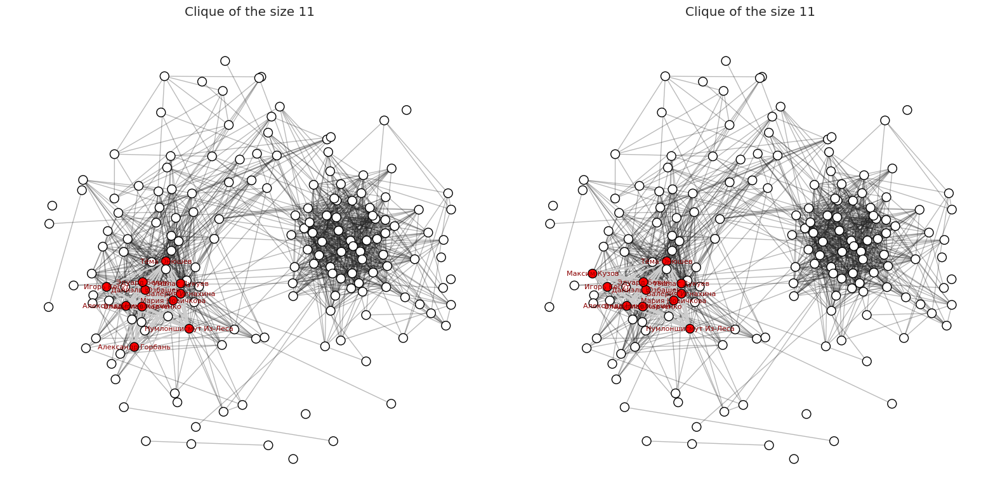

In [79]:
plt.figure(figsize=(16, 8))

pos = nx.spring_layout(my_graph, k=0.7)

for i in range(colors.shape[0]):
    b_edges = np.array(list(my_graph.edges))[widths[i] == widths[i].max()]

    plt.subplot(1, 2, i+1)
    nodes = nx.draw_networkx_nodes(
        my_graph,
        pos,
        node_color=colors[i],
        node_size=100,
        linewidths=1,
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        my_graph,
        pos,
        alpha=0.3,
        width=widths[i].min()
    )
    nx.draw_networkx_edges(
        my_graph,
        pos,
        width=widths[i].max(),
        edgelist=b_edges,
        edge_color='#CCCCCC',
    )

    labels = {node: name for node, name in zip(my_graph.nodes(), names[i]) if name}
    
    nx.draw_networkx_labels(
        my_graph,
        pos,
        labels=labels,
        font_size=8,
        font_color='darkred',
    )
    
    plt.title('Clique of the size {}'.format(size))
    plt.axis('off')

plt.tight_layout()
plt.show()

#### k-core

In [ ]:
def k_core_decompose(G):
    return np.array(list(nx.core_number(G).values()))

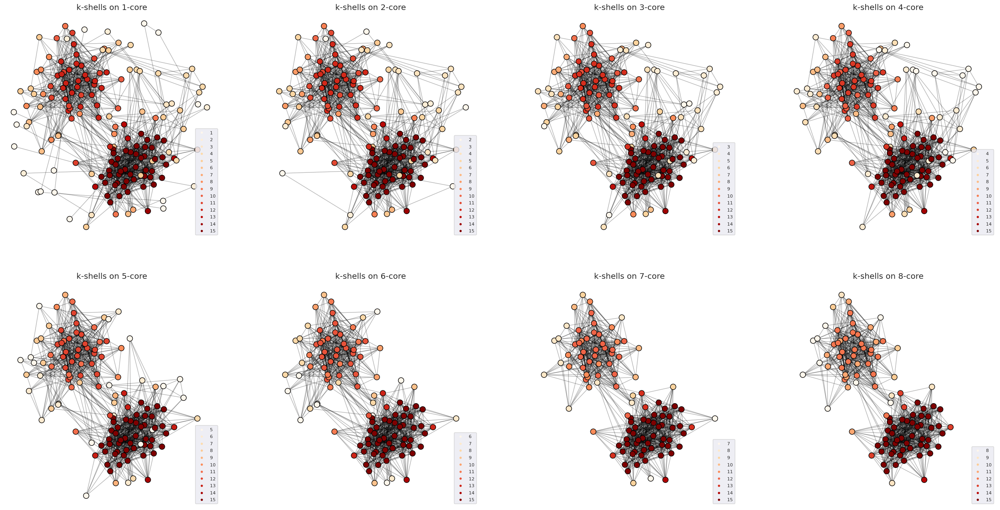

In [ ]:
labels_cores = k_core_decompose(my_graph)

plt.figure(figsize=(8*4, 8*2))
pos = nx.spring_layout(my_graph, k=0.7)

x_max, y_max = np.array(list(pos.values())).max(axis=0)
x_min, y_min = np.array(list(pos.values())).min(axis=0)

for i in range(8):
    plt.subplot(2, 4, i+1)
    subG = nx.k_core(my_graph, i+1)
    nodes = nx.draw_networkx_nodes(
        subG,
        pos,
        cmap=plt.cm.OrRd,
        node_color=k_core_decompose(subG),
        node_size=100,
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        subG,
        pos,
        alpha=0.3,
        width=1,
        edge_color='black'
    )
    eps = (x_max - x_min) * 0.05
    plt.xlim(x_min-eps, x_max+eps)
    plt.ylim(y_min-eps, y_max+eps)
    plt.legend(*nodes.legend_elements(), loc='lower right', fontsize=8,  markerscale=0.5)
    plt.axis('off')
    plt.title('k-shells on {}-core'.format(i+1))

### 3.2 Various community detection

#### Agglomerative

In [21]:
def simrank_distance(G):
    simrank_sim = dict(nx.simrank_similarity(G))
    
    nodes = list(G.nodes())
    n = len(nodes)
    
    distance_matrix = np.zeros((n, n))

    for i in range(n):
        for j in range(i, n):
            node_i = nodes[i]
            node_j = nodes[j]
            simrank_similarity = simrank_sim[node_i][node_j]
            distance_value = 1.0 - simrank_similarity
            
            distance_matrix[i, j] = distance_value
            distance_matrix[j, i] = distance_value
    
    return distance_matrix

In [32]:
from scipy.spatial.distance import squareform
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score


def agglomerative_clustering(distance, max_distance):
    condensed_distance = squareform(distance) if distance.ndim == 1 else distance
    
    clustering = AgglomerativeClustering(
        affinity='precomputed',
        linkage='complete',
        distance_threshold=max_distance,
        n_clusters=None
    )
    
    labels = clustering.fit_predict(condensed_distance)
    return labels

In [33]:
def k_core_decompose(G):
    return np.array(list(nx.core_number(G).values()))

/home/sadevans/space/personal/ITMO/NetworkAnalysis/graphml_project_venv/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


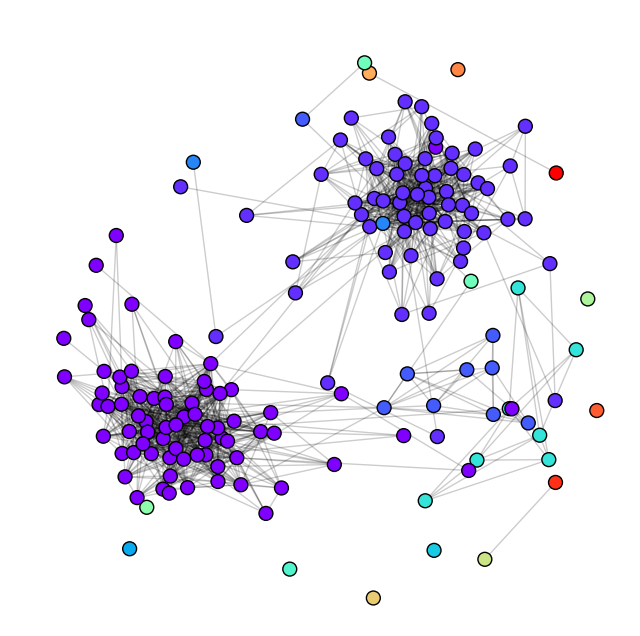

In [41]:
distance = simrank_distance(my_graph)
labels_aggl = agglomerative_clustering(distance, 0.9)

pos = nx.spring_layout(my_graph, k=0.5)


plt.figure(figsize=(8, 8))
nx.draw_networkx_nodes(
    my_graph,
    pos,
    cmap=plt.cm.rainbow,
    node_color=labels_aggl,
    node_size=100,
    linewidths=1,
    edgecolors='black'
)
nx.draw_networkx_edges(
    my_graph,
    pos,
    alpha=0.2,
    edge_color='black'
)
plt.axis('off')
plt.show()

#### Girvan Newman

In [66]:
def remove_bridges(G):
    num_components = len(list(nx.connected_components(G)))
    while len(list(nx.connected_components(G))) != num_components + 1:
        if len(G.edges) == 0:
            break
        edge_betweenness = nx.edge_betweenness_centrality(G)
        if not edge_betweenness:
            break
        max_betweenness = max(edge_betweenness.values())
        bridges = [edge for edge, centrality in edge_betweenness.items() if centrality == max_betweenness]
        G.remove_edges_from(bridges)
    return G

def girvan_newman(G, n):
    labels = np.zeros((n, len(G)), dtype=int)
    _G = G.copy()

    node_to_index = {node: idx for idx, node in enumerate(G.nodes())}

    for division in range(n):
        remove_bridges(_G)
        for i, cc in enumerate(nx.connected_components(_G)):
            indices = [node_to_index[node] for node in cc]
            labels[division, indices] = i

    return labels

In [67]:
labels_gn = girvan_newman(my_graph, 4)
labels_gn.shape


(4, 170)

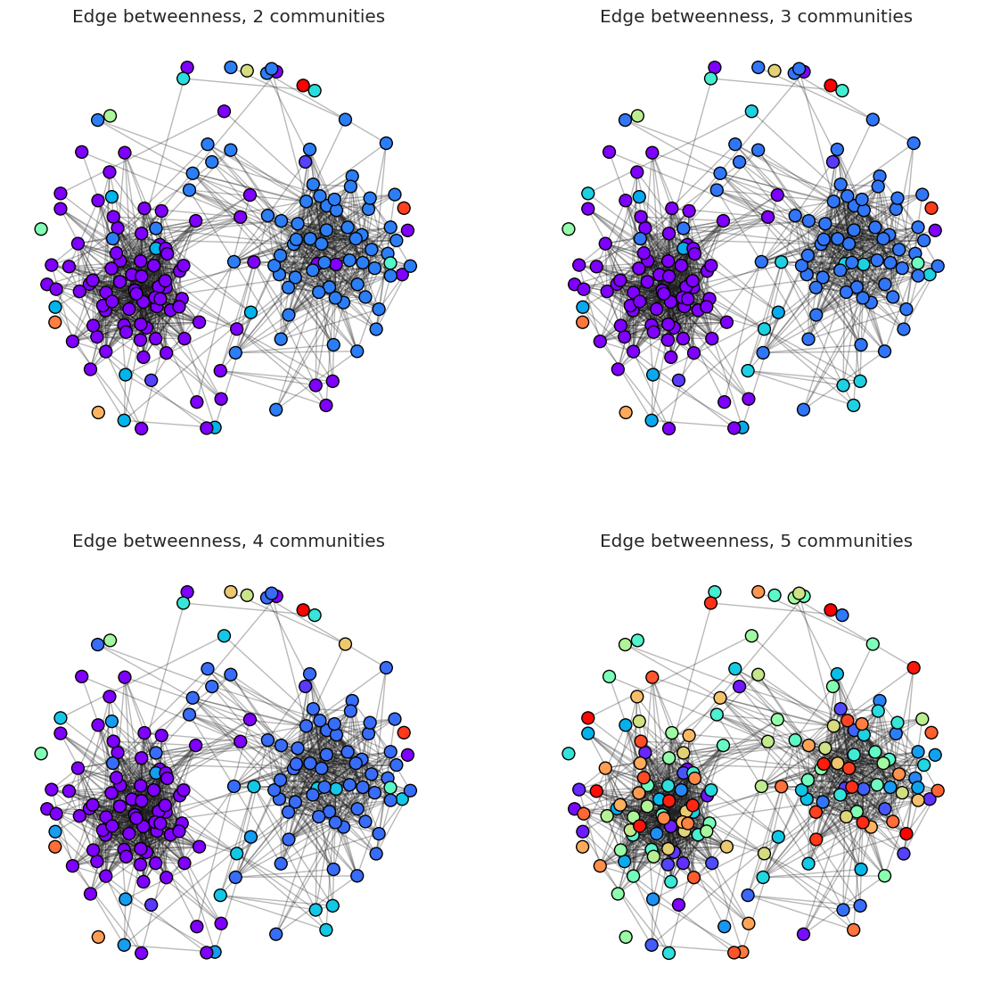

In [68]:
plt.figure(figsize=(7*2, 7*2))

pos = nx.spring_layout(my_graph, k=0.7)

for i in range(0,labels_gn.shape[0]):
    plt.subplot(2, 2, i+1)
    nx.draw_networkx_nodes(
        my_graph,
        pos,
        cmap=plt.cm.rainbow,
        node_color=labels_gn[i],
        node_size=100,
        edgecolors='black'
    )
    nx.draw_networkx_edges(my_graph, pos, alpha=0.3)
    plt.title('Edge betweenness, {} communities'.format(i+2))
    plt.axis('off')

#### Laplacian eigenmaps

In [242]:
from scipy.sparse.linalg import eigsh
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize

def laplacian_eigenmaps(G, n_clusters=2):
    L = nx.normalized_laplacian_matrix(G).astype(float)

    _, eigenvectors = eigsh(L, k=n_clusters, which='SM')
    embedding = normalize(eigenvectors)
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    labels = kmeans.fit_predict(embedding)
    
    return labels, embedding

/home/sadevans/space/personal/ITMO/NetworkAnalysis/graphml_project_venv/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


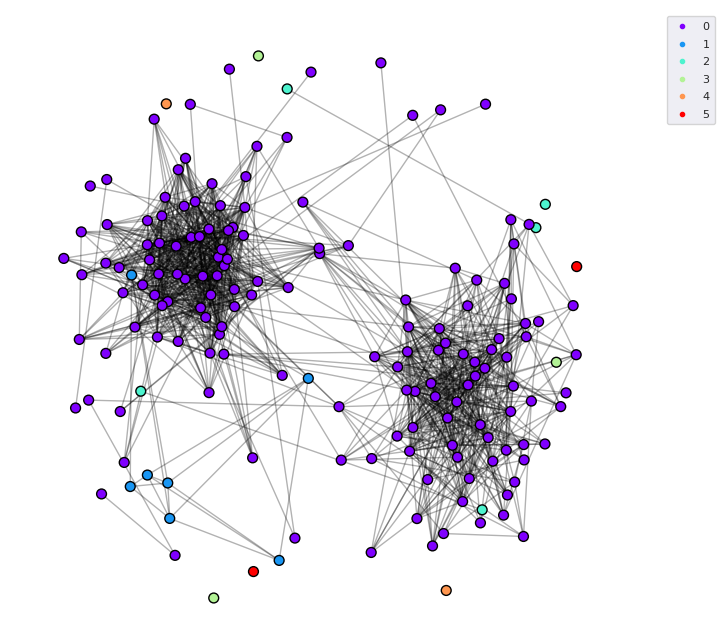

In [246]:
n_clusters = 6
labels_le, embedding_le = laplacian_eigenmaps(my_graph, n_clusters=n_clusters)

pos = nx.spring_layout(my_graph, k=0.7)
plt.figure(figsize=(8, 8))

nodes = nx.draw_networkx_nodes(
    my_graph,
    pos=pos,
    cmap=plt.cm.rainbow,
    node_color=labels_le,
    node_size=50,
    edgecolors='black'
)


nx.draw_networkx_edges(
    my_graph,
    pos=pos,
    alpha=0.3,
    width=1,
    edge_color='black'
)


plt.legend(*nodes.legend_elements(), loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=8, markerscale=0.5)

# plt.title("Laplacian Eigenmaps Clustering")
plt.axis('off')
plt.show()

### 3.3 Modularity

In [ ]:
# def modularity(A, communities):
#     m = A.sum() / 2
#     res = (A - expected_edges(A, m)) * kronecker(A, communities)
#     return res.sum() / 2 / m

def expected_edges(A, m):
    # YOUR CODE HERE
    # raise NotImplementedError()
    n = A.shape[0]
    k = np.sum(A, axis=1)
    expected = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            expected[i, j] = k[i] * k[j] / (2 * m)

    return expected
def remove_bridges(G):
    if G.number_of_edges() == 0:
        return G
    
    num_components = len(list(nx.connected_components(G)))
    while len(list(nx.connected_components(G))) != num_components + 1:
        edge_betweenness = nx.edge_betweenness_centrality(G)
        
        # Check if edge_betweenness is empty
        if not edge_betweenness:
            break
        
        max_betweenness = max(edge_betweenness.values())
        bridges = [edge for edge, centrality in edge_betweenness.items() if centrality == max_betweenness]
        G.remove_edges_from(bridges)
    return G


def kronecker(A, communities, node_mapping):
    n = A.shape[0]
    delta = np.zeros((n, n))
    for community in communities:
        for i in community:
            for j in community:
                delta[node_mapping[i], node_mapping[j]] = 1
    return delta

def edge_betw_modularity(G, n):
    A = nx.to_numpy_array(G)
    _G = G.copy()
    modularity_scores = []
    node_mapping = {node: idx for idx, node in enumerate(_G.nodes())}
    for _ in range(n):
        remove_bridges(_G)
        A = nx.to_numpy_array(_G)
        communities = nx.connected_components(_G)
        mod_score = modularity(A, communities, node_mapping)
        print(f"Iteration {_}: Modularity = {mod_score}")
        modularity_scores.append(mod_score)
    return np.array(modularity_scores)

def modularity(A, communities, node_mapping):
    m = A.sum() / 2
    res = (A - expected_edges(A, m)) * kronecker(A, communities, node_mapping)
    return res.sum() / (2 * m)


n_iterations = 3
mod_val = edge_betw_modularity(my_graph, n_iterations)


Iteration 0: Modularity = 0.500676041103299
Iteration 1: Modularity = 0.5251133353346261
Iteration 2: Modularity = 0.5256763888888889


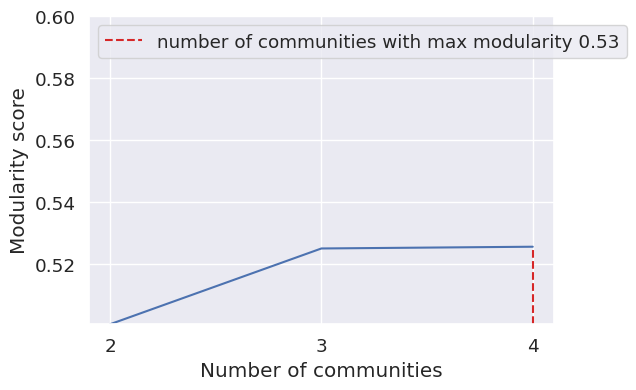

In [64]:
plt.figure(figsize=(6, 4))
plt.plot(np.arange(n_iterations)+2, mod_val)
best_n = np.argmax(mod_val) + 2
label = 'number of communities with max modularity {:.2f}'.format(max(mod_val))
plt.plot(
    [best_n, best_n], [min(mod_val), max(mod_val)],
    linestyle='--', c='tab:red',
    label=label
)
plt.ylabel('Modularity score')
plt.xlabel('Number of communities')
plt.legend(loc='upper left')
plt.xticks(np.arange(n_iterations)+2)
plt.ylim((mod_val.min(), 0.6))
plt.show()